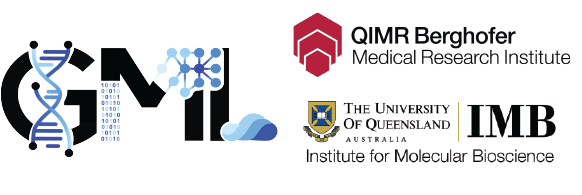 \
**This script has been generated by Onkar Mulay from the *Genomics and Machine Learning Lab*:**
* Data used below is currently not published or publically available. For more information about the scripts or for the use of this datasets beyond this tutorial please contact o.mulay@uq.edu.au
* Code and *conda* environments used are available from https://github.com/GMLTestLab/gml-teaching

## Table of Contents

| Section   | Description             |
|-----------|-------------------------|
| [Cell-Cell-Interactions](#Cell-Cell-Interactions) | Overview of the notebook.    |
| [CellChat](#CellChat)           | Cell-cell interaction algorithm for single-cell and spatial data.      |

###### Users should only run Inference of CCI and MMCCI; as cell-cell interactions is time consuming step, we have already run CCI and saved the results.

##### Legend
<font color="black"> &#9899; Explaination of the concept. \
<font color="blue"> &#128309; Explaination/summary of the code block. \
<font color="red"> &#128308; Anything after the text in red needs to be run; else avoid running the cell. \
<font color="purple"> &#128995; Questions. \
<font color="green"> &#128994; Hints for the quesitons.

# Cell-Cell-Interactions

<!-- <font color="black">  -->
Multicellular life relies on the coordination of cellular activities, which depend on cell–cell interactions (CCIs) across an organism’s diverse cell types and tissues. Thus, studies on cellular functions increasingly require consideration of the community context of each cell. CCIs leverage diverse molecules, including ions, metabolites, integrins, receptors, junction proteins, structural proteins, ligands and secreted proteins of the extracellular matrix. Some molecules support structural CCIs (for example, cell adhesion molecules), whereas ligands such as hormones, growth factors, chemokines, cytokines and neurotransmitters mediate cell–cell communication.
    
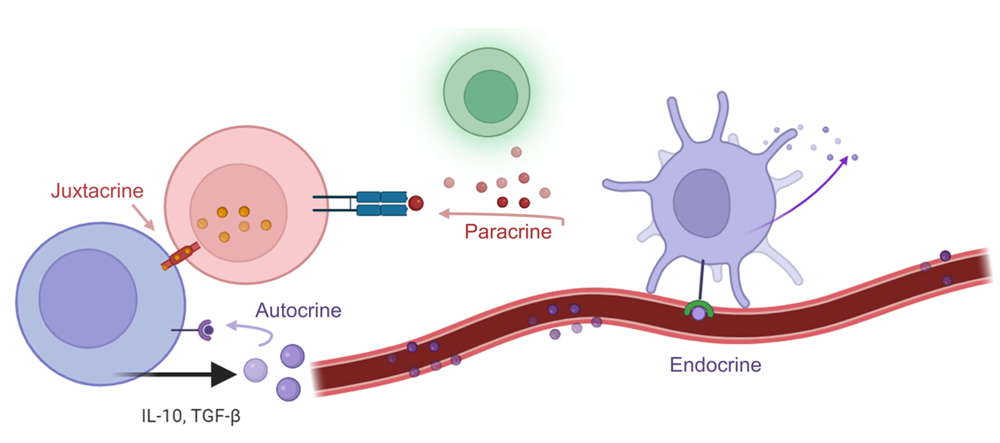
    

Cell–cell interactions orchestrate organismal development, homeostasis and single-cell functions. When cells do not properly interact or improperly decode molecular messages, disease ensues. Thus, the identification and quantification of intercellular signalling pathways has become a common analysis performed across diverse disciplines.
(Armingol et al., 2020) https://www.nature.com/articles/s41576-020-00292-x

### Computational Requirements

To perform cell-cell interaction in Python or R, we need:- 
1. Gene expression matrix
2. Ligand-Receptor Database
3. Spatial Location of cells/spots
4. Cell-type annotations 

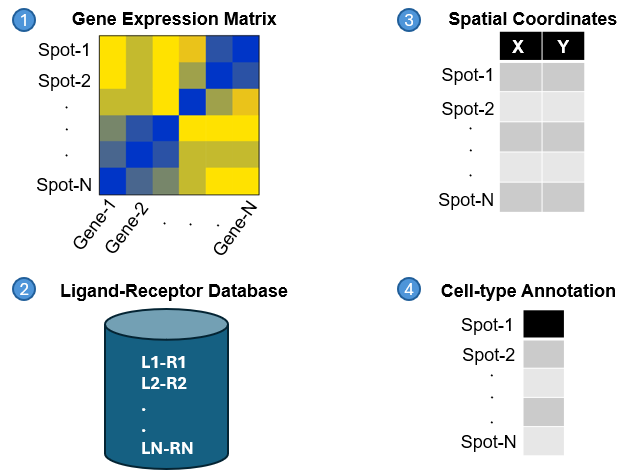

### LRI and CCI Score calculation followed by permutation test
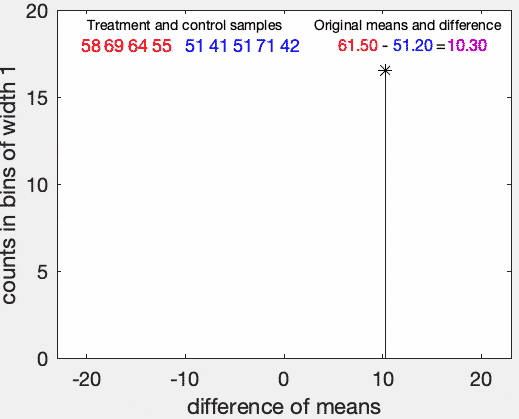

## CellChat

CellChat is R packge to perform cell-cell interactions of single cell and spatial data. \
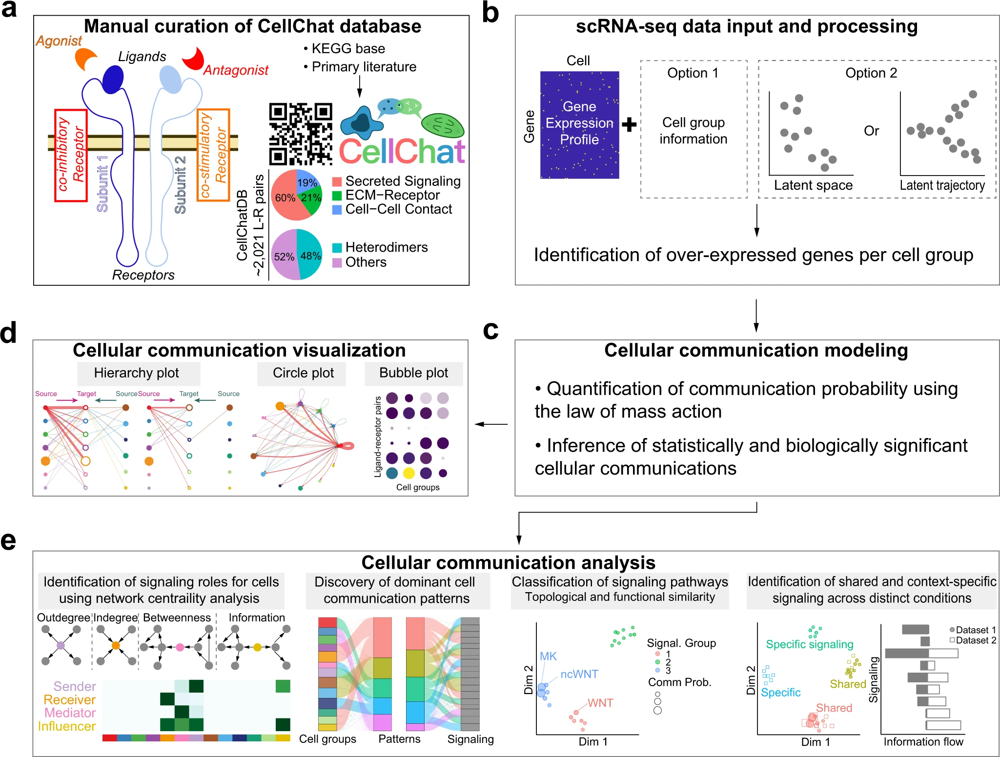 \
(Jin et al., 2021) \
Steps to calculate interaction scores:-
1. Calculate Ligand-Receptor average expression for all cell-types.
2. Interaction scores are computed by taking the product of the ligand and receptor separetly in each cell-type. 
3. For spatial data the neighbors/groups are defined based on spatial constraints.
4. To account for noise - abundant genes are used, and then later a permutation test is performed to find significantly interacting pairs.

#### Code

In [1]:
suppressMessages(library(CellChat))
suppressMessages(library(Seurat))

data_path = '/software/winter_school_2024/data/'

<font color="blue"> For CellChat we load the skin-cancer Visium dataset. Four main functions that are used to create a cellchat object prior to running the algorithm are:- </font>
    
`GetAssayData`: To get the RAW gene expression matrix from Seurat object \
`normalizeData`: To normalise the gene expression data  \
`computeCellDistance`: Compute cell-cell distance based on the spatial coordinates \
`createCellChat`: Create a cellchat object with required metadata

In [2]:
# Load the RAW spatial or single-cell data
obj <- readRDS(paste0(data_path, "finalised_files_to_move/Visium_Skin_A2_cellchat.rds"))

# Load the deconvolution or cell-annotation results
deconvolution = read.csv(paste0(data_path, "finalised_files_to_move/visium_decon.csv"), row.names=1)
obj <- obj[,rownames(deconvolution)] # Subset the good spots which have cell-type deconvolution results
obj <- AddMetaData(obj, deconvolution)
obj$cell_type <- colnames(deconvolution)[max.col(deconvolution,ties.method="first")]
obj <- obj[,rownames(na.omit(obj@meta.data))]

# Normalise the data
data.input = GetAssayData(obj, slot = "data", assay = "Spatial") 
data.input <- normalizeData(data.input) # normalize data matrix

# Set the metadata
meta = data.frame(labels = Seurat::Idents(obj), slices = "slice1", row.names = names(Seurat::Idents(obj)))
meta$slices <- factor(meta$slices)
meta$labels <- factor(obj@meta.data$cell_type)

# Set the spatial boundry constraints - for spatial data
spatial.locs = GetTissueCoordinates(obj, scale = NULL, cols = c("imagerow", "imagecol")) 
scalefactors = jsonlite::fromJSON(txt = file.path(data_path, 'scalefactors_json.json')) # this contains scaling factors
spot.size = 65 # the theoretical spot size (um) in 10X Visium
conversion.factor = spot.size/scalefactors$spot_diameter_fullres
spatial.factors = data.frame(ratio = conversion.factor, tol = spot.size/2)

d.spatial <- computeCellDistance(coordinates = spatial.locs, ratio = spatial.factors$ratio, tol = spatial.factors$tol)

# Create a CellChat object
cellchat <- createCellChat(object = data.input, meta = meta, group.by = "labels",
                           datatype = "spatial", coordinates = spatial.locs, spatial.factors = spatial.factors)
cellchat

[1] "Create a CellChat object from a data matrix"
Create a CellChat object from spatial transcriptomics data... 
Set cell identities for the new CellChat object 
The cell groups used for CellChat analysis are  Imm_CD8..T.cell, Imm_Endothelial.cell, Imm_Fibroblast, Imm_Macrophage, Imm_Mast.Cells, KC_Cornified, KC_Differentiating, Melanocytes, Pericytes 


An object of class CellChat created from a single dataset 
 18085 genes.
 917 cells. 
CellChat analysis of spatial data! The input spatial locations are 
                   x_cent y_cent
AACACGTGCATCGCAC-1  26848  21796
AACAGGAAGAGCATAG-1  24386  24722
AACATCTAATGACCGG-1  23863  15211
AACATGCGCAAGTGAG-1  23746  21940
AACCAGAATCAGACGT-1  21184  10809
AACCATCGGAAGCGAC-1  23739  22335

<font color="blue"> Exploring CellChat LR-pairs database and selecting the required LR-pair category. Here, we select secreted signalling pairs for quick run. 

Rows: 3,249
Columns: 28
$ interaction_name         <chr> "TGFB1_TGFBR1_TGFBR2", "TGFB2_TGFBR1_TGFBR2",…
$ pathway_name             <chr> "TGFb", "TGFb", "TGFb", "TGFb", "TGFb", "TGFb…
$ ligand                   <chr> "TGFB1", "TGFB2", "TGFB3", "TGFB1", "TGFB1", …
$ receptor                 <chr> "TGFbR1_R2", "TGFbR1_R2", "TGFbR1_R2", "ACVR1…
$ agonist                  <chr> "TGFb agonist", "TGFb agonist", "TGFb agonist…
$ antagonist               <chr> "TGFb antagonist", "TGFb antagonist", "TGFb a…
$ co_A_receptor            <chr> "", "", "", "", "", "", "", "", "", "", "", "…
$ co_I_receptor            <chr> "TGFb inhibition receptor", "TGFb inhibition …
$ evidence                 <chr> "KEGG: hsa04350", "KEGG: hsa04350", "KEGG: hs…
$ annotation               <chr> "Secreted Signaling", "Secreted Signaling", "…
$ interaction_name_2       <chr> "TGFB1 - (TGFBR1+TGFBR2)", "TGFB2 - (TGFBR1+T…
$ is_neurotransmitter      <lgl> FALSE, FALSE, FALSE, FALSE, FALSE, FALSE, FAL…
$ ligand.symbol 

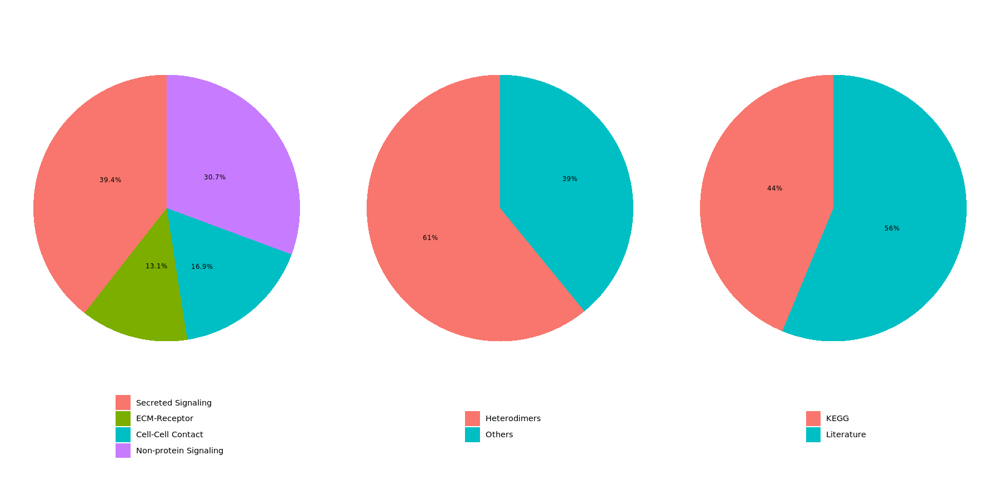

In [16]:
options(repr.plot.height=7.5,repr.plot.width=15)
CellChatDB <- CellChatDB.human
CellChatDB.use <- subsetDB(CellChatDB, search = "Secreted Signaling") # use Secreted Signaling
showDatabaseCategory(CellChatDB)

# Show the structure of the database
dplyr::glimpse(CellChatDB$interaction)

# use a subset of CellChatDB for cell-cell communication analysis
CellChatDB.use <- subsetDB(CellChatDB, search = "Secreted Signaling") # use Secreted Signaling

# set the used database in the object
cellchat@DB <- CellChatDB.use

#### Preprocessing the expression data for cell-cell communication analysis

<font color="blue">To infer the cell state-specific communications, we identify over-expressed ligands or receptors in one cell group and then identify over-expressed ligand-receptor interactions if either ligand or receptor is over-expressed.

In [17]:
cellchat <- subsetData(cellchat)
future::plan("multisession", workers = 4) 
cellchat <- identifyOverExpressedGenes(cellchat)
cellchat <- identifyOverExpressedInteractions(cellchat)

The number of highly variable ligand-receptor pairs used for signaling inference is 972 


Function `projectData` is to project gene expression data onto protein-protein interaction (PPI) network. Specifically, a diffusion process is used to smooth genes’ expression values based on their neighbors’ defined in a high-confidence experimentally validated protein-protein network. This function is useful when analyzing single-cell data with shallow sequencing depth because the projection reduces the dropout effects of signaling genes, in particular for possible zero expression of subunits of ligands/receptors. One might be concerned about the possible artifact introduced by this diffusion process, however, it will only introduce very weak communications. 

USERS can also skip this step and set `raw.use = TRUE` in the function `computeCommunProb()`. 

`filterCommunication`: Remove the interactions that are not present in more than 8 cells. \
`aggregateNet`: Aggregate the communication probability of all LR pairs in each cell-type pair.

In [21]:
# project gene expression data onto PPI (Optional: when running it, USER should set `raw.use = FALSE` in the function `computeCommunProb()` in order to use the projected data)
# cellchat <- projectData(cellchat, PPI.human)

# Run CellChat
# cellchat <- computeCommunProb(cellchat, type = "truncatedMean", trim = 0.1,
#                               distance.use = TRUE, interaction.range = 250, scale.distance = 0.01,
#                               contact.dependent = TRUE, contact.range = 100)
# cellchat <- filterCommunication(cellchat, min.cells = 8)
# cellchat <- aggregateNet(cellchat)
# cellchat@dr <- subsetCommunication(cellchat)
# saveRDS("CellChat.rds")

truncatedMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on spatial transcriptomics data using distances as constraints of the computed communication probability <<< [2024-05-30 07:55:21]"


 ### <font color="red">Inference of cell-cell communication network - Run </font>

CellChat infers the biologically significant cell-cell communication by assigning each interaction with a probability value and peforming a permutation test. CellChat models the probability of cell-cell communication by integrating gene expression with prior known knowledge of the interactions between signaling ligands, receptors and their cofactors using the law of mass action.

The number of inferred ligand-receptor pairs clearly depends on the method for calculating the average gene expression per cell group. 

When analyzing unsorted single-cell transcriptomes, under the assumption that abundant cell populations tend to send collectively stronger signals than the rare cell populations, CellChat can also consider the effect of cell proportion in each cell group in the probability calculation. USER can set `population.size` = TRUE.

In [1]:
library(png)

In [2]:
## This code will help speed up the plotting when running in base R
show_plot <- function(plot, filename = "temp.png", height = 500, width = 1500, res = 100) {                                                  
  temp_filename <- tempfile(fileext = ".png")
  grDevices::png(filename = temp_filename, width = width, height = height, res = res)
  print(plot)
  dev.off()
  img <- png::readPNG(temp_filename)
  grid::grid.raster(img)
}

`computeCommunProbPathway` Compute the communication probability on signaling pathway level by summarizing all related ligands/receptors 

In [3]:
# Load the saved CellChat object
cellchat <- readRDS(paste0(data_path, "finalised_files_to_move/CellChat.rds"))
cellchat <- computeCommunProbPathway(cellchat)

`netVisual_circle` To visualise cell-cell interactions in a network plot \
`netVisual_heatmap` To visualise cell-cell interactions in a heatmap

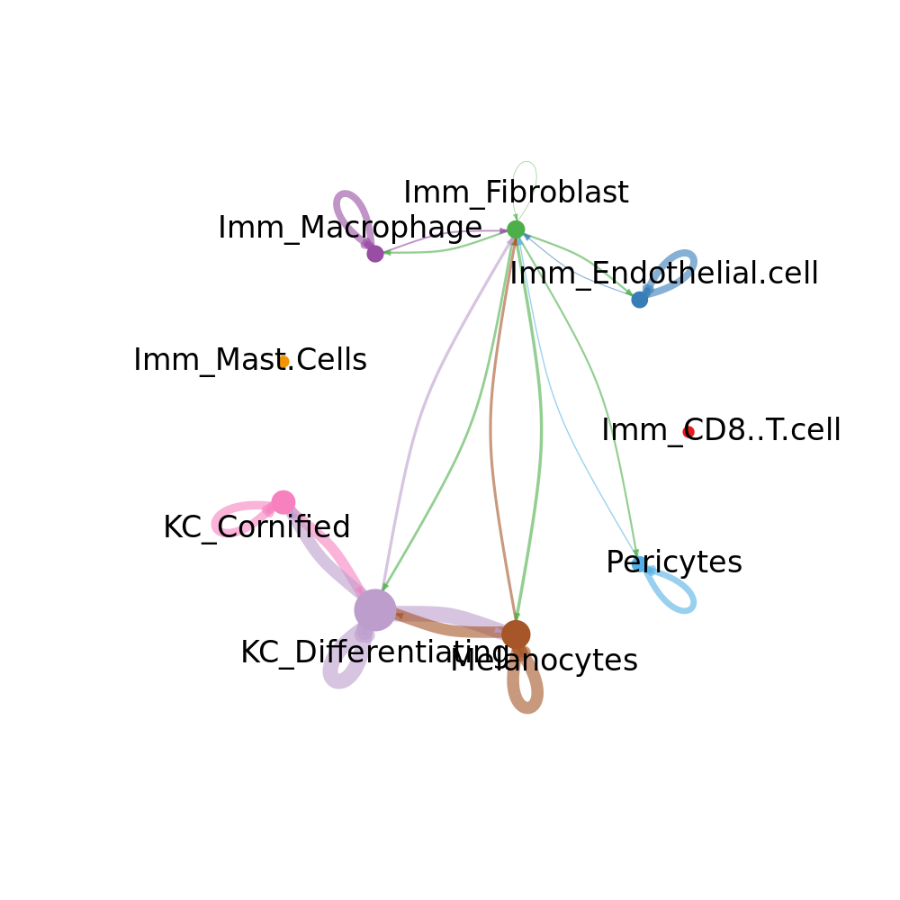

In [19]:
groupSize <- as.numeric(table(cellchat@idents))
options(plot.repr.height=10,plot.repr.width=10)
show_plot(netVisual_circle(cellchat@net$count, vertex.weight = rowSums(cellchat@net$count), 
                 weight.scale = T, label.edge= F, title.name = "Number of interactions"))

Do heatmap based on a single object 




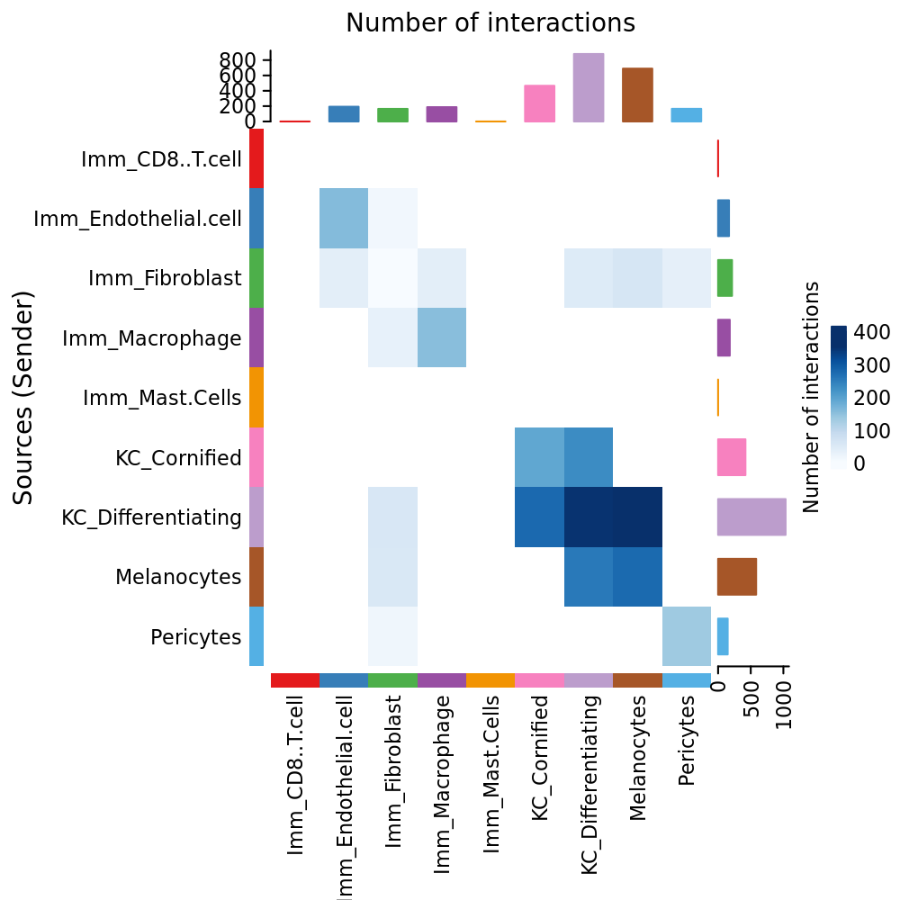

In [20]:
options(repr.plot.height=7.5,repr.plot.width=7.5)
show_plot(netVisual_heatmap(cellchat, measure = "count", color.heatmap = "Blues"),width = 500)

`netVisual_aggregate` with `layout` as *circle* for network plot or *sptial* for spatial location of CCI for  $IGF$ pathway.

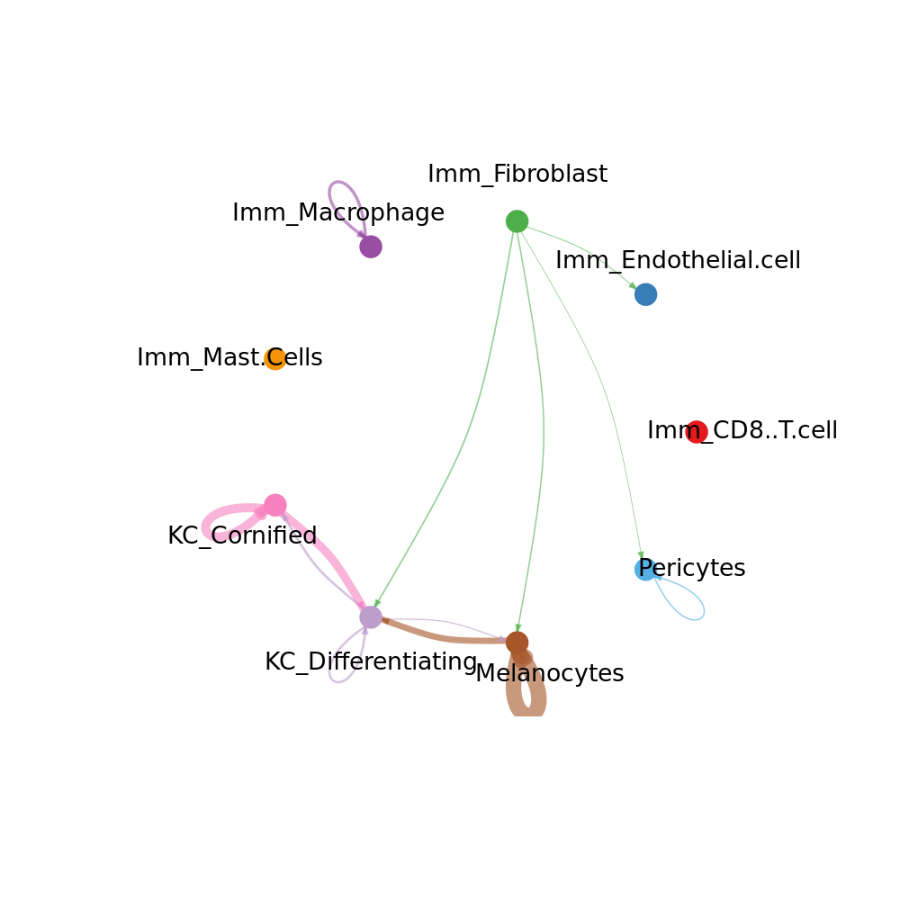

In [21]:
pathways.show <- c("IGF") 
# Circle plot
show_plot(netVisual_aggregate(cellchat, signaling = pathways.show, layout = "circle"), height = 500, width = 500)

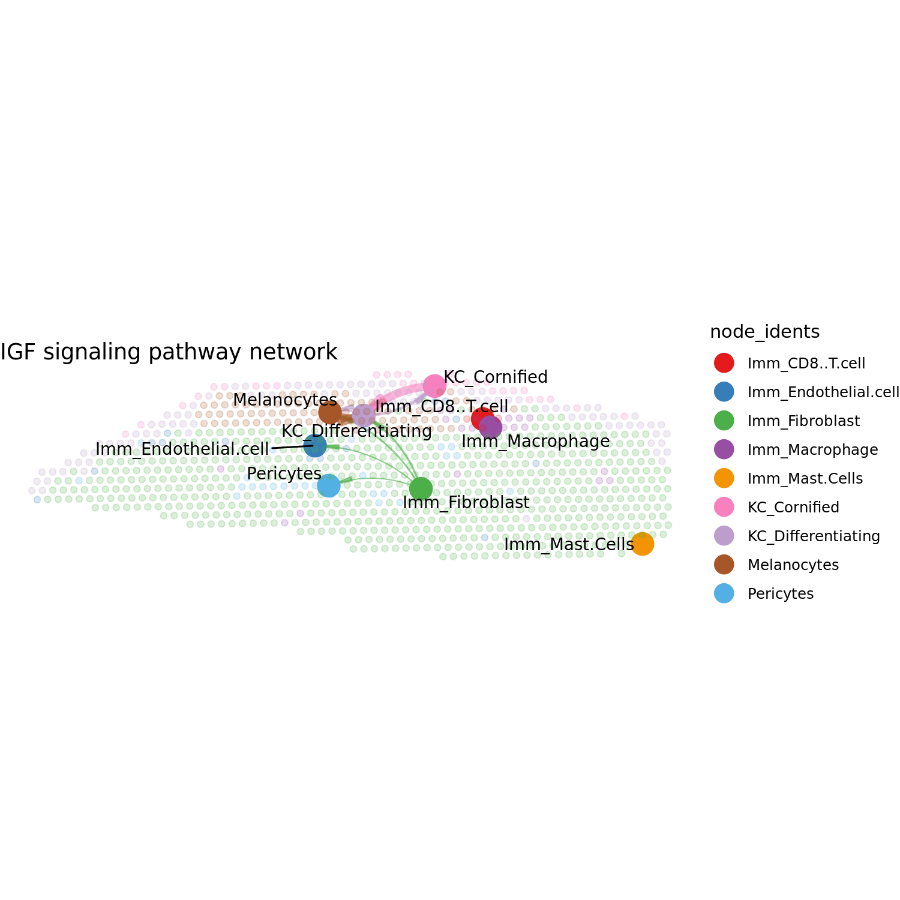

In [24]:
# Spatial plot
show_plot(netVisual_aggregate(cellchat, signaling = pathways.show, layout = "spatial", 
                          edge.width.max = 2, vertex.size.max = 1, alpha.image = 0.2, vertex.label.cex = 3.5)& theme_void(),width=1500)

`spatialFeaturePlot` To visualise the LR coexpression on tissue

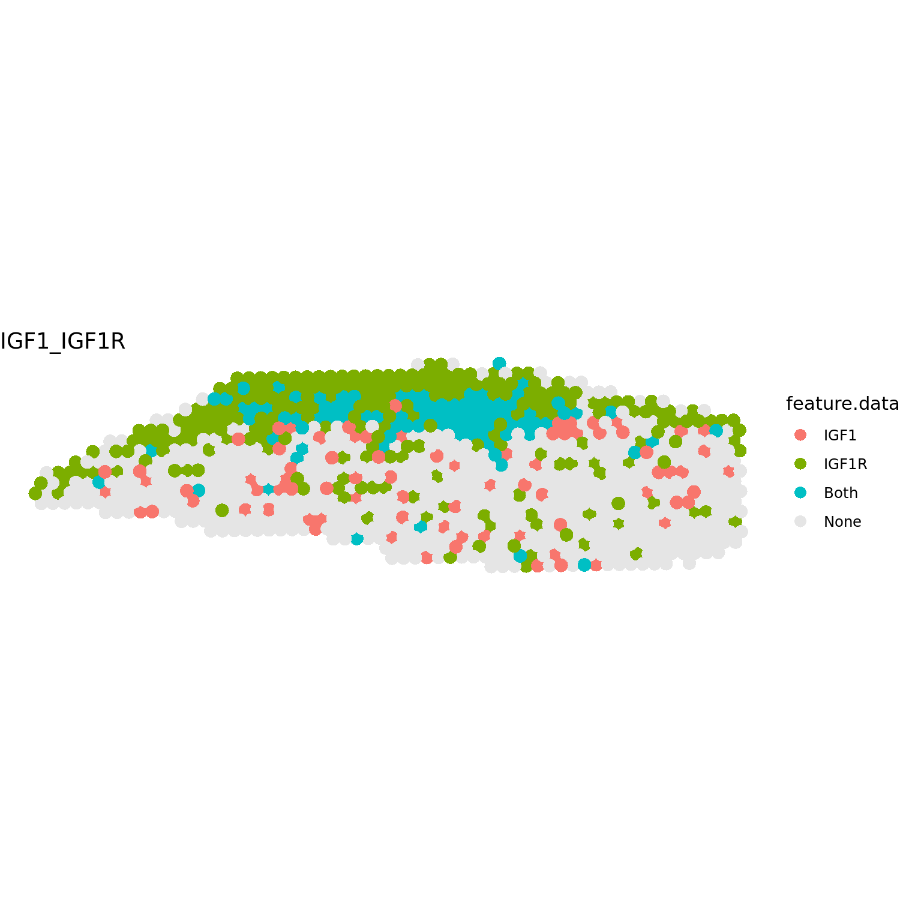

In [26]:
options(plot.repr.height=5,plot.repr.width=10)
show_plot(spatialFeaturePlot(cellchat, pairLR.use = "IGF1_IGF1R", point.size = 3.5, do.binary = TRUE, cutoff = 0.05, enriched.only = F, color.heatmap = "Reds", direction = 1) & theme_void(), 
         width=1500, height=1500)

### <font color="purple"> Questions: </font>

<font color="purple">
    
    
1. Which LR pairs are significantly interacting?
2. What are the other pathways that are interesting?
    
<font color="green"> **Hint:** Explore the cellchat object, check the information in different slots. Eg. cellchat@dr and try more slots.